# Credit Card Fraud Detection

In [64]:
#Importing libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [65]:
#Reading the data 

df_data=pd.read_csv("../input/creditcardfraud/creditcard.csv")
df_data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [66]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

# Data Analysis
Plotting visualization to understand the data

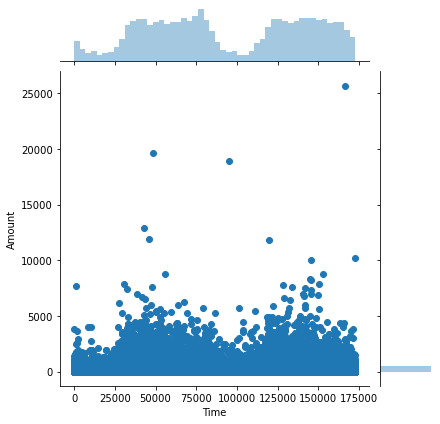

In [5]:
#Joint Plot between Time and Amount

sns.jointplot(data=df_data,x='Time',y='Amount')

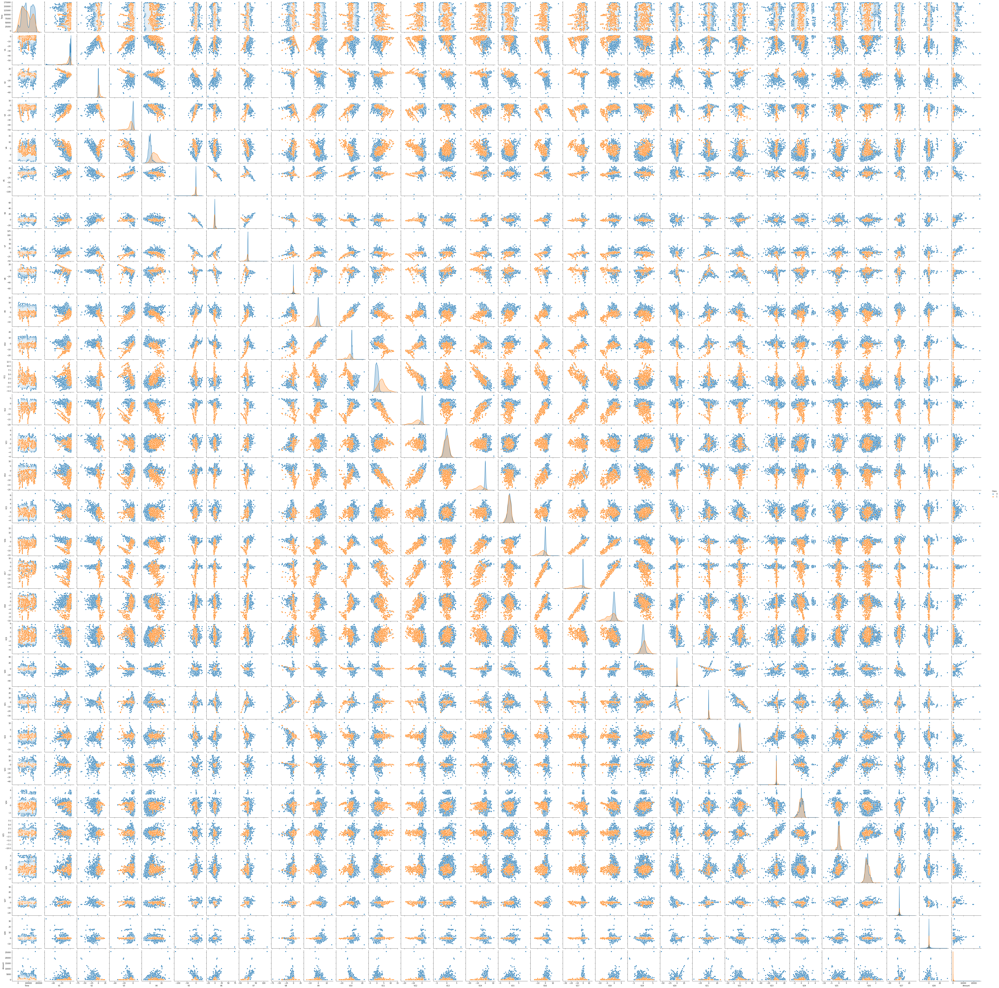

In [9]:
#Plotting every column in respect of Class

sns.pairplot(data=df_data,hue='Class')

# Standarize the variables

In [67]:
#Standard Scaling the variables
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(df_data[['Time','Amount']])
scaled_features=scaler.transform(df_data[['Time','Amount']])

In [74]:
#Combing scaled features to single dataframe
df_feat = pd.DataFrame(scaled_features,columns=['Time','Amount'])
df_new=df_data.drop(['Time','Amount'],axis=1)
df_final=pd.concat([df_feat, df_new], axis=1)
df_final.head()

,Time,Amount,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,-1.996583,0.244964,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-1.996583,-0.342475,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,-1.996562,1.160686,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,-1.996562,0.140534,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,-1.996541,-0.073403,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


# Train Test Split

In [75]:
#Dividing dataset into train and test set

from sklearn.model_selection import train_test_split
X=df_final.drop('Class',axis=1)
y=df_final['Class']
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=101)

# Random Forest Model

In [76]:
#Training the Random Forest model

from sklearn.ensemble import RandomForestClassifier
random=RandomForestClassifier(class_weight='balanced')
random.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced')

In [77]:
#Save the model

from joblib import dump, load
filename = 'creditcard_fraud.joblib'
dump(random, filename) 

['creditcard_fraud.joblib']

In [78]:
#Cross Validating the model
from sklearn.model_selection import cross_val_score
print (np.mean(cross_val_score(random, X_train, y_train, cv=10)))

0.9995034214819215


# Prediction and Evaluation

In [79]:
#Making predictions on the model

prediction=random.predict(X_test)

In [81]:
#Using confusion matrix to check accuracy of our model

from sklearn.metrics import confusion_matrix,classification_report
print(classification_report(y_test,prediction))
print("Confusion Matrix\n",confusion_matrix(y_test,prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.95      0.76      0.85       144

    accuracy                           1.00     85443
   macro avg       0.97      0.88      0.92     85443
weighted avg       1.00      1.00      1.00     85443

Confusion Matrix [[85293     6]
 [   34   110]]


# Questions from Task Description
Followed by Approach and Model Selection

a)	Train a classifier to predict if a transaction is a fraudulent transaction or not ?
    
    * For Credit Card Fraud Detection problem which falls in classification problem, we need to select a supervised machine learning algorithm.
    * Basically, five models came to my mind to solve this problem which were: Logistic Regression, Naive Bayes, Support Vector Machine, K- Nearest Neighbors and Random Forest.
    * In machine learning world, any ML algorithms is neither right nor wrong but its based on the problem and the dataset to solve the particular problem along with model accuracy and performance
    * Here I preferred to use Random Forest Classifier over other classifiers because Random Forest Algorithm is based on the concept of ensemble learning, which is a process of combining multiple classifiers to solve a complex problem and to improve the performance of the model
    * Ensemble Learning creates multiple datasets and multiple classifiers to make decision and in the end it combines all classifiers to give output. random Forest handles imbalanced dataset along with cross validation. Also, it deals with overfiiting problem and manage large dataset     
    
b)	How would you deploy this model in production? (show example or link to an approach that you would like to follow)

    * At production level, we can create a environment in Cloud Composer something like Google Cloud Composer. After that we can upload the scripts on server(GCP).
    * We can set script to run as per periodically through cron job in any data pipeline platform (Apache Airflow).
    * As per the script, it will perform ETL process on day-to-day data and store the output to the databse for accessing through the API or to Google BigQuery Server. This output database can be connected to any visualization platform like Tableau and we can see live dashboards.      

c)	If you had more time, how could you improve this model?
    
    * For improving side, I would like to try different models rather than this one. I'll check accuracy and predictions results to compare it with Random Forest. Try to handle imbalance datasets with different techniques along with hyperparameter tuning. Also, we can try deep learning methods using Tensorflow, Keras or PyTorch. We can apply neural nets to large amount of datasets to work efficiently. I'll also assure that the model is not overfiiting or underfitting and give best result on unseen dataset. 